In [ ]:
#@title Install Required Packages
!pip install seaborn==0.10.0
!pip install scanpy[leiden]

     |████████████████████████████████| 225kB 5.4MB/s 
  Found existing installation: seaborn 0.11.0
    Uninstalling seaborn-0.11.0:
      Successfully uninstalled seaborn-0.11.0
     |████████████████████████████████| 7.7MB 4.0MB/s 
     |████████████████████████████████| 122kB 43.1MB/s 
     |████████████████████████████████| 3.2MB 44.6MB/s 
     |████████████████████████████████| 2.4MB 31.1MB/s 
     |████████████████████████████████| 51kB 6.6MB/s 
     |████████████████████████████████| 71kB 9.0MB/s 
  Created wheel for sinfo: filename=sinfo-0.3.1-cp36-none-any.whl size=7018 sha256=8d811b84c46c09897b5eabb2a1261933692fdd0f20cc06087acd8a12d2f251d7
  Stored in directory: /root/.cache/pip/wheels/11/f0/23/347d6d8e59787c2bc272162d18223dc3b45bd6dc40aceee6af
Successfully built sinfo


In [ ]:
#@title Mount Google Drive (You don't need to run this if you are running notebooks on your laptop)

from google.colab import drive

# The following command will prompt a URL for you to click and obtain the
# authorization code

drive.mount("/content/drive")

Mounted at /content/drive


In [ ]:
!pip install matplotlib

In [ ]:
import pandas as pd
from pathlib import Path
import scanpy as sc

# set scanpy plotting parameter to dpi = 150
sc.settings.set_figure_params(dpi=150)

# change this to where you save the data
#DATA = Path("/content/drive/MyDrive/2020 ECBM E4060/Final project/DATA") #THIS IS FOR ANNA
DATA = Path("/content/drive/MyDrive/Final project/DATA") #EVERYONE ELSE USE THIS LINE INSTEAD



## Loading the data

In [ ]:
import numpy as np

GSM334 = pd.read_csv(DATA / "GSM3494334_Lib1-3_E3.5_counts.csv.gz",compression='gzip', index_col = "Unnamed: 0").astype('int8')
GSM335 = pd.read_csv(DATA / "GSM3494335_Lib1-4_E3.5_counts.csv.gz",compression='gzip', index_col = "Unnamed: 0").astype('int8')
print(np.shape(GSM334))
print(np.shape(GSM335))

GSM336 = pd.read_csv(DATA /"GSM3494336_Lib1-1_E4.5_counts.csv.gz",compression='gzip', index_col = "Unnamed: 0").astype('int8')
GSM337 = pd.read_csv(DATA /"GSM3494337_Lib1-2_E4.5_counts.csv.gz",compression='gzip', index_col = "Unnamed: 0").astype('int8')
print(np.shape(GSM336))
print(np.shape(GSM337))


GSM338 = pd.read_csv(DATA /"GSM3494338_Lib2-1_E5.5_counts.csv.gz",compression='gzip', index_col = "Unnamed: 0").astype('int8')
GSM339 = pd.read_csv(DATA /"GSM3494339_Lib2-2_E5.5_counts.csv.gz",compression='gzip', index_col = "Unnamed: 0").astype('int8')
GSM340 = pd.read_csv(DATA /"GSM3494340_Lib2-3_E5.5_counts.csv.gz",compression='gzip', index_col = "Unnamed: 0").astype('int8')
print(np.shape(GSM338))
print(np.shape(GSM339))
print(np.shape(GSM340))
#print("3")

#GSM341 = pd.read_csv(DATA /"GSM3494341_Lib3-1_E6.5_counts.csv.gz",compression='gzip', index_col = "Unnamed: 0").astype('int8')
#GSM342 = pd.read_csv(DATA /"GSM3494342_Lib3-2_E6.5_counts.csv.gz",compression='gzip', index_col = "Unnamed: 0").astype('int8')
#print(np.shape(GSM341))
#print(np.shape(GSM342))

(801, 15962)
(844, 16288)
(304, 14114)
(386, 15462)
(3275, 18594)
(10486, 18828)
(7345, 18733)


In [ ]:
#GSM341 = pd.read_csv(DATA /"GSM3494341_Lib3-1_E6.5_counts.csv.gz",compression='gzip', index_col = "Unnamed: 0").astype('int8')
#GSM342 = pd.read_csv(DATA /"GSM3494342_Lib3-2_E6.5_counts.csv.gz",compression='gzip', index_col = "Unnamed: 0").astype('int8')
#print(np.shape(GSM341))
#print(np.shape(GSM342))

In [ ]:
#e_3 = pd.concat([GSM334,GSM335]).fillna(0).astype('int8')

In [ ]:
e_3_5 = pd.concat([GSM334,GSM335,GSM336,GSM337,GSM338,GSM339,GSM340]).fillna(0).astype('int8')

In [ ]:
del GSM334,GSM335,GSM336,GSM337,GSM338,GSM339,GSM340

In [ ]:
#e_3_6 = pd.concat([e_3_5,GSM341,GSM342]).fillna(0).astype('int8')
#del e_3_5,GSM341,GSM342

In [ ]:
#del raw_AD

In [ ]:
raw_AD = sc.AnnData(X = e_3_5)

raw_AD.obs_names = e_3_5.index.tolist()
raw_AD.obs_names_make_unique(join="-")

raw_AD.var_names = e_3_5.columns.tolist()
raw_AD.var_names_make_unique(join="-")

Observation names are not unique. To make them unique, call `.obs_names_make_unique`.


In [ ]:
raw_AD.var_names

Index(['0610007P14RIK', '0610009B22RIK', '0610009L18RIK', '0610009O20RIK',
       '0610010F05RIK', '0610010K14RIK', '0610012G03RIK', '0610030E20RIK',
       '0610033M10RIK', '0610037L13RIK',
       ...
       'VMN1R86', 'VMN1R91', 'VMN2R13', 'VMN2R36', 'VMN2R79', 'WFDC6A',
       'WFDC8', 'WI1-1735G24.1', 'ZFP352', 'ZFP366'],
      dtype='object', length=20790)

In [ ]:
raw_AD.obs_names

Index(['b'TTTATGCTCAGCTGGC'', 'b'TTTATGCTCGCGGATC'', 'b'TTTATGCAGAACAATC'',
       'b'TTTACTGTCGCGATCG'', 'b'TTTACTGAGAAACCAT'', 'b'TTTGTCAGTCAAACTC'',
       'b'TTTGCGCTCCAGGGCT'', 'b'TTTGCGCGTCCCGACA'', 'b'TTATGCTCAAAGTGCG'',
       'b'TTATGCTCACCCAGTG'',
       ...
       'b'CCCAGTTAGCGTTGCC'', 'b'CCCAGTTGTAGAAAGG'', 'b'CCCAGTTGTGAAATCA'',
       'b'CCCAGTTGTCTAACGT'', 'b'CCCAGTTGTCTAGCGC'', 'b'CCCAGTTGTCAACATC'',
       'b'CCCAGTTCATTACGAC'', 'b'CCCAGTTCAACACCCG'', 'b'CCCAGTTCACATGGGA'',
       'b'CCCAGTTCACCGTTGG''],
      dtype='object', length=23441)

## Filtering genes and cells & normalization

Calculate the number of genes expressed per cell, and number of cells expressed per gene. Note we don't want to filter out anything yet,, so we set min_cells and min_genes to 0

In [ ]:
sc.pp.filter_cells(raw_AD, min_genes=0)
sc.pp.filter_cells(raw_AD, min_counts=0)

sc.pp.filter_genes(raw_AD, min_cells=0)

After the calculation, you can see the number of cells that each gene expressed in and number of genes that each cell expressed in the `var` and `obs` field.

In [ ]:
raw_AD.obs.head()

,n_genes,n_counts
b'TTTATGCTCAGCTGGC',5741,27655.0
b'TTTATGCTCGCGGATC',5627,27865.0
b'TTTATGCAGAACAATC',244,328.0
b'TTTACTGTCGCGATCG',308,393.0
b'TTTACTGAGAAACCAT',4682,24075.0


In [ ]:
raw_AD.var.head()

,n_cells
0610007P14RIK,8659
0610009B22RIK,8273
0610009L18RIK,293
0610009O20RIK,2378
0610010F05RIK,2257


We can then visualize the number of genes and number of reads by violin plot and then by a scatter plot for their association

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


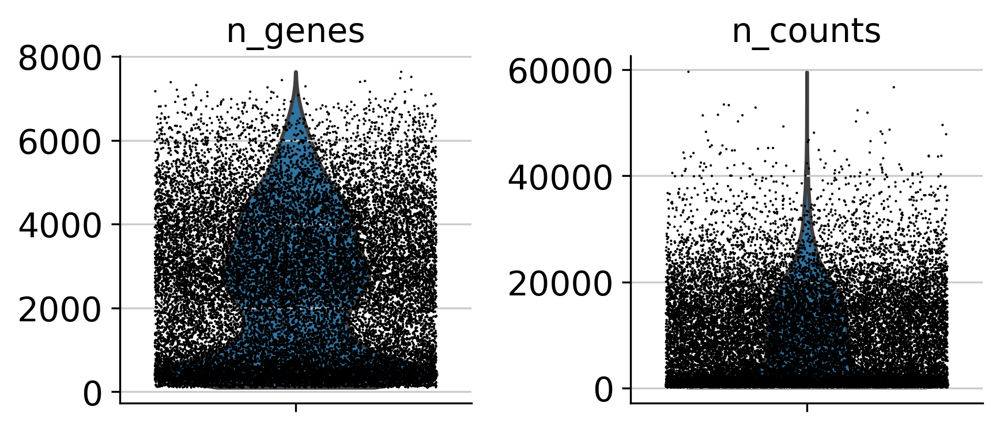

In [ ]:
sc.pl.violin(raw_AD, ['n_genes', 'n_counts'],
             jitter=0.4, multi_panel=True)

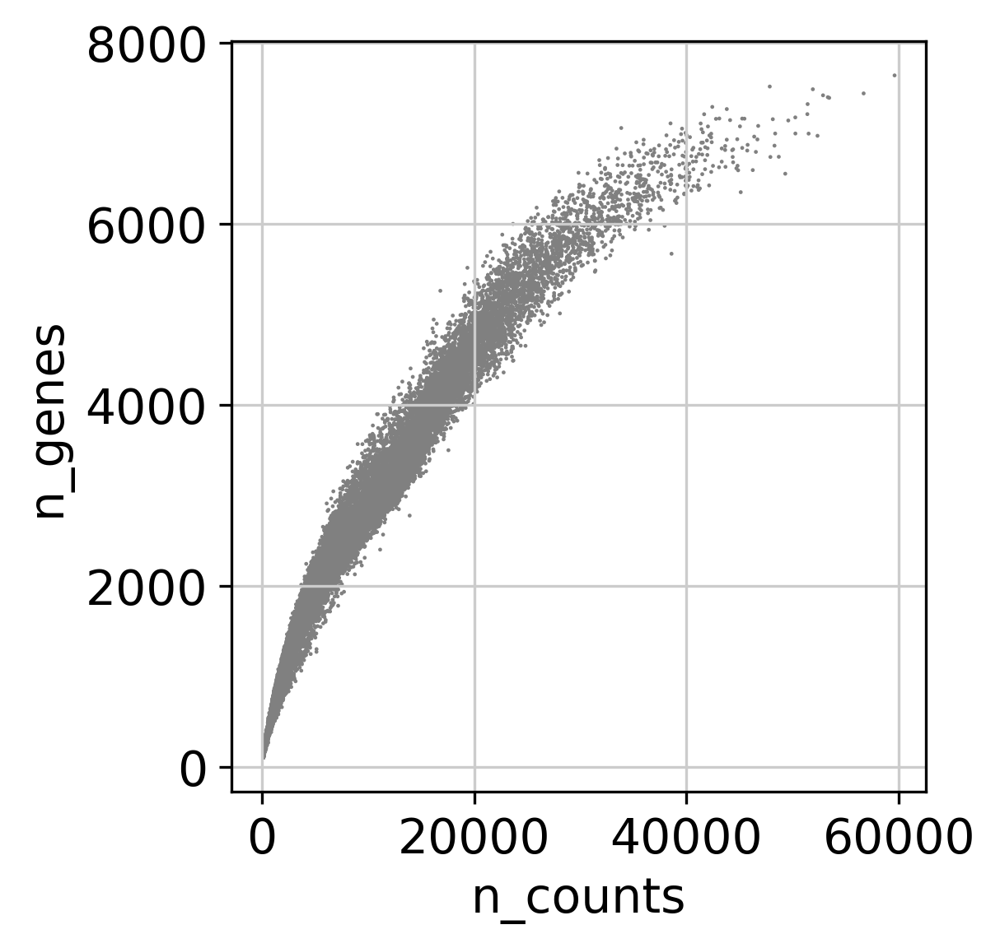

In [ ]:
sc.pl.scatter(raw_AD, x='n_counts', y='n_genes')

In [ ]:
raw_AD

AnnData object with n_obs × n_vars = 23441 × 20790
    obs: 'n_genes', 'n_counts'
    var: 'n_cells'

We now performs a series of filtering based on our observation. We will only keep genes those at least expressed in 5 cells (`n_cells` >= 5), cells those at least have 200 genes expressed (`n_genes` > 200), and less than 7000 (`n_genes` < 7000).

In [ ]:
raw_AD = raw_AD[:, raw_AD.var["n_cells"] >= 5]
raw_AD = raw_AD[(raw_AD.obs["n_genes"] < 7000) & (raw_AD.obs["n_genes"] > 200), :]


raw_AD

View of AnnData object with n_obs × n_vars = 22739 × 18355
    obs: 'n_genes', 'n_counts'
    var: 'n_cells'

After the filtering, we see we are left with 22,739 cells by 18,355 genes.

In [ ]:
#raw_AD.X = np.nan_to_num(raw_AD.X, nan=0.1)

**Normalization**
Now a simple normalization would be to divide the raw count by the total library size of the cell (the total read count of a cell) to adjust for library size effect, then do a log transformation. This can be done by the `sc.pp.normalize_per_cell` function. It also contains a scaling factor to avoid that everything will be negative. The output value is called CP10K (counts per 10K UMI).

In [ ]:
sc.pp.normalize_per_cell(raw_AD)
sc.pp.log1p(raw_AD)

Trying to set attribute `.obs` of view, copying.
/usr/local/lib/python3.6/dist-packages/scanpy/preprocessing/_simple.py:318: RuntimeWarning: invalid value encountered in log1p
  np.log1p(X, out=X)


In [ ]:
raw_AD.X = np.nan_to_num(raw_AD.X, nan=0.1)

**Identifying highly variable genes**

Next step we will find the highly variable genes. In `scanpy` the default method is to bin the genes based on the mean expression of the gene, then identify genes with high dispersion (`variance / mean`) within each bin. This is due to the fact that variance of the RNASeq data is associated with its mean, since it follows a negative binomial distribution.

In [ ]:
sc.pp.highly_variable_genes(raw_AD, min_mean=0.0125, max_mean=4, min_disp=0.5)

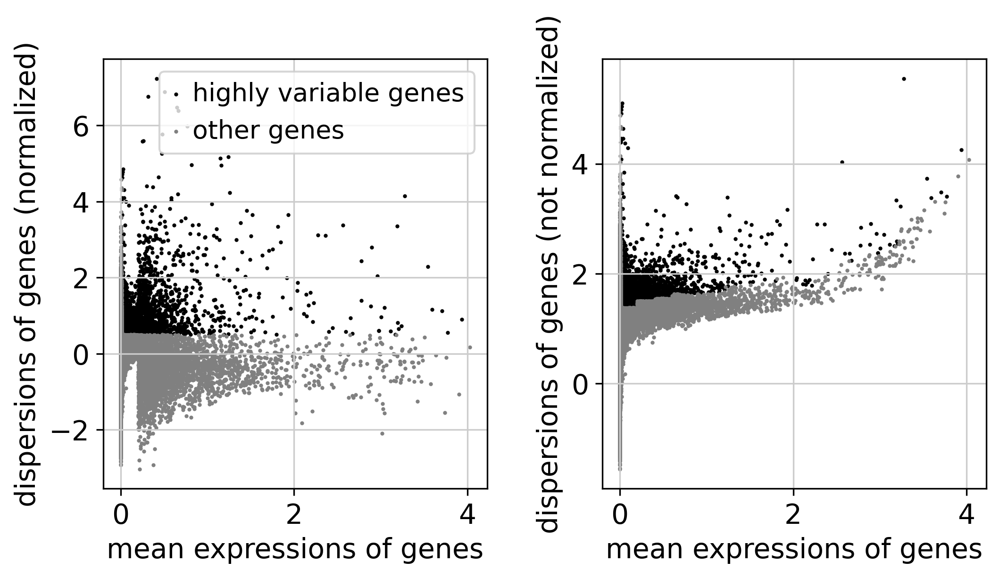

In [ ]:
sc.pl.highly_variable_genes(raw_AD)

We can then use only the highly variable genes to perform dimension reduction and other visualization. The reason we do this is because we are interested in the genes that have varied expression between our cells as they may explain some of the heterogeity between clusters later on.

In [ ]:
raw_AD = raw_AD[:, raw_AD.var['highly_variable']]
print(raw_AD.shape)
raw_AD.var_names

(22739, 4115)


Index(['0610007P14RIK', '0610037L13RIK', '0610040J01RIK', '1110008L16RIK',
       '1110008P14RIK', '1110012L19RIK', '1110019D14RIK', '1110034G24RIK',
       '1110059G10RIK', '1600002H07RIK',
       ...
       'ADAMTS1', 'IFNLR1', 'LRRC19', 'PRL3D1', 'PRL3D3', 'PRL7A1', 'SLC2A2',
       'GNG11', 'KCNJ5', 'PRL3D2'],
      dtype='object', length=4115)

The next normalization step is to remove the read count size effect (this is similar to library size effect, but through regression it makes the expression values more towards normal distribution).

In [ ]:
sc.pp.regress_out(raw_AD, ['n_counts'])

We now scale the expression to uni-variance, and clip the maximum value to 10.

In [ ]:
sc.pp.scale(raw_AD, max_value=10)

## Dimension reduction and visualization

To investigate the single cell RNASeq data we used unsupervised learning, including the following methods:

* [Principle Component Analysis (PCA)](https://en.wikipedia.org/wiki/Principal_component_analysis): for dimension reduction
* [Uniform Manifold Approximation (UMAP)](https://arxiv.org/abs/1802.03426) : also for visualization
* [Leiden](https://arxiv.org/abs/1810.08473): a network connectivity-based clustering method


First we'll perform PCA on the data. Most of the downstream algorithms, including tSNE, UMAP and louvain all prefer a lower dimension representation of the data, to reduce computational time and denoise. We can simply use the `sc.tl.pca` function to perform PCA and investigate the contribution to variance of each principle component.

In [ ]:
sc.tl.pca(raw_AD, svd_solver='arpack')

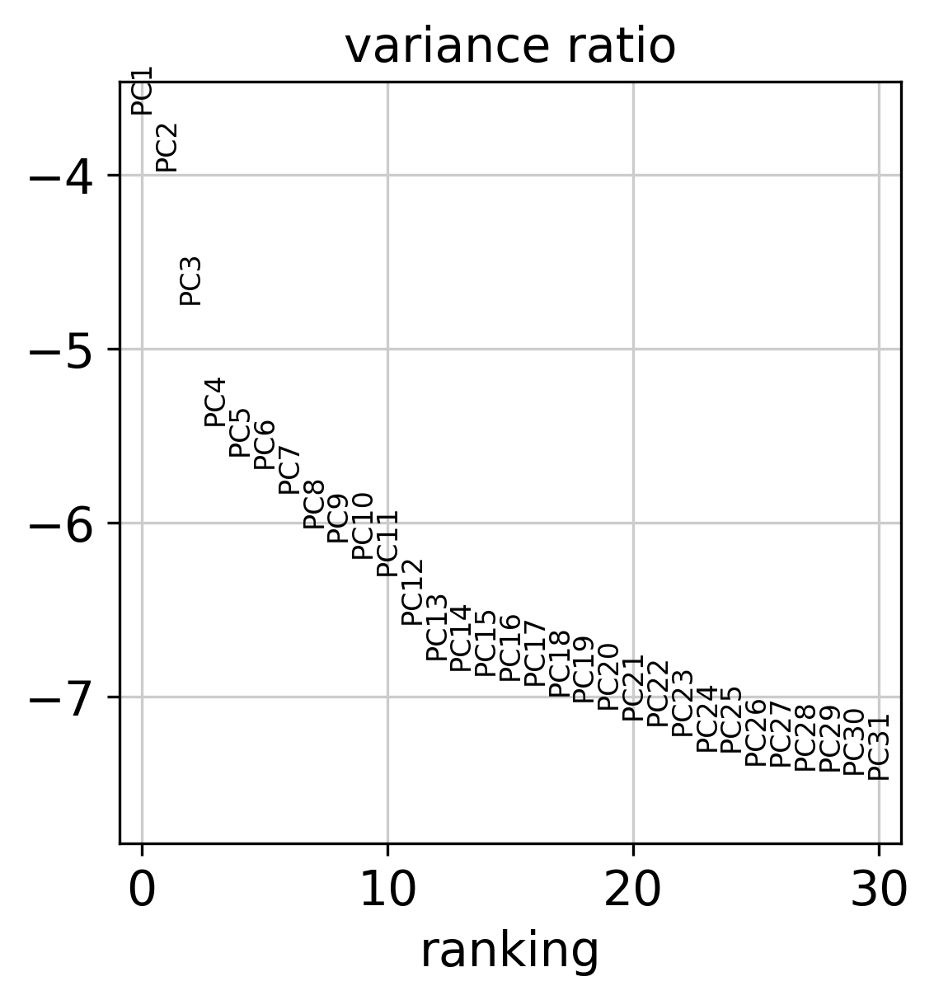

In [ ]:
sc.pl.pca_variance_ratio(raw_AD, log=True)

We chose to continue with the first 20 principal compontents (PCs). 

After dimension reduction, we can compute a neighborhood graph using the principle component. The neighborhood graph construct a network-like graph of cells based on their distances of principle component. You can adjust the n_neighbors and n_pcs parameters for number of neighbors to search and number of principle components to use.

In [ ]:
sc.pp.neighbors(raw_AD, n_neighbors=15, n_pcs=20)

We can then embed and visualize the neighbor information to a 2-dimensional space in a UMAP plot also using Leiden.

Note embedding algorithms like  and UMAP only represent the local data structure into 2-dimensional space, **the distances between dots in the figure does not necessarily means the distances between dots in its feature space**. Therefore, it does not provide us cluster information. To do that, we will need further cluster algorithm, [`leiden`](https://arxiv.org/abs/1810.08473) is one of the algorithm that explore the neighboring information and create clusters.

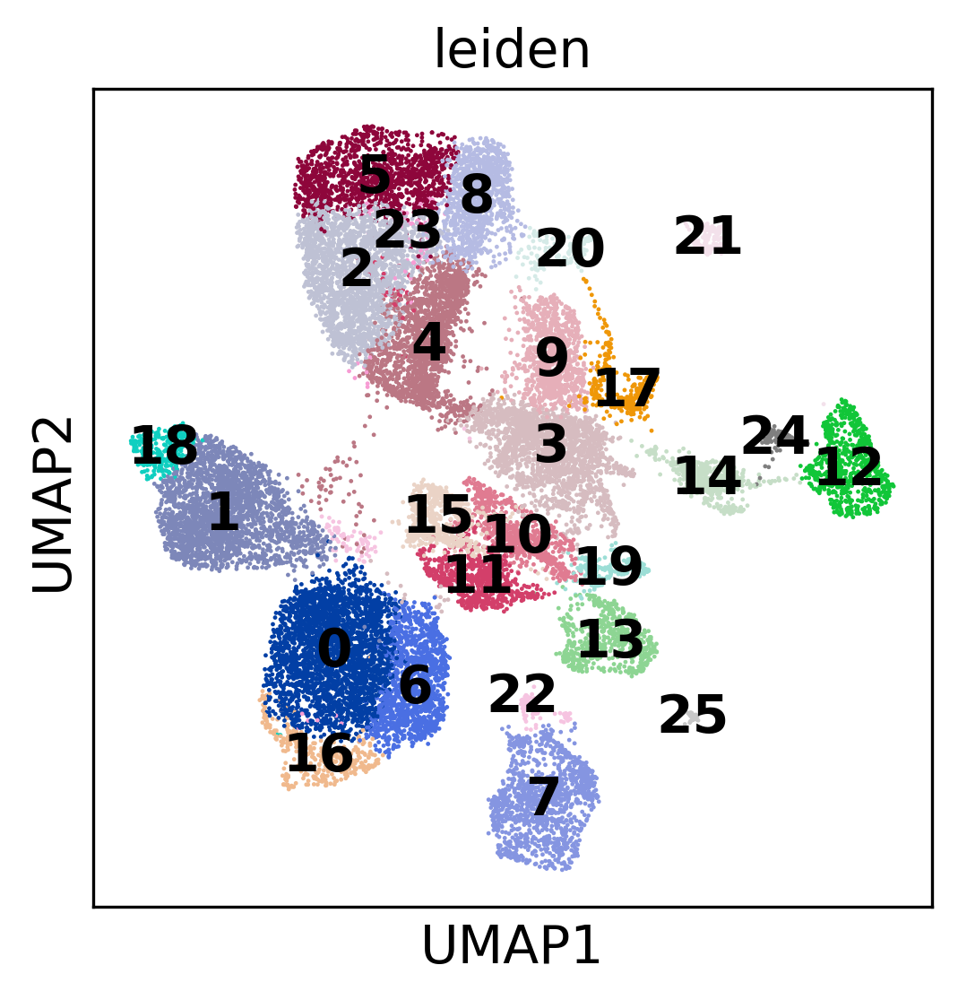

In [ ]:
sc.tl.leiden(raw_AD)
sc.tl.umap(raw_AD)
sc.pl.umap(raw_AD, color=['leiden'], legend_loc="on data")

Next we compare what are the genes differentially expressed in each cluster compared with the rest. Here we use simple `t-test` to accomplish this.

In [ ]:
sc.tl.rank_genes_groups(raw_AD, 'leiden', method='t-test')

/usr/local/lib/python3.6/dist-packages/scanpy/tools/_rank_genes_groups.py:408: RuntimeWarning: invalid value encountered in log2
  foldchanges[global_indices]


In [ ]:
pd.DataFrame(raw_AD.uns['rank_genes_groups']['names']).head(25)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25
0,RPS2,GM10073,SLC16A1,RPL41,HSP90B1,AMOT,RPS6,AY036118,DAB2,RPL41,TRAP1A,GM1673,ECHDC2,DDAH1,GABARAPL2,GM1673,POU5F1,KHDC1C,SPINK1,CALD1,COL4A1,COL4A1,MT-ATP8,DAB2,DPPA1,MYLPF
1,MKRN1,SNRPG,LGMN,GM10076,LGMN,DAB2,RPL35,MT-ATP8,LGMN,MT1,S100A6,H19,SOD2,TMSB4X,DPPA5A,H19,SOX4,KHDC1A,GM10837,KRT8,SERPINH1,CUBN,MT-ND5,LGMN,GPX4,HSPB1
2,RPL10,RPS12-PS3,APLP2,TMSB10,LRP2,SLC16A1,RPL10,HIST1H1E,CTSL,SPINK1,TMSB4X,TMSB4X,DPPA2,MORC4,MAP1LC3B,S100A6,MEG3,FBP1,FTL1-PS1,S100A6,HSP90B1,SERPINH1,MT-ND4L,EMB,GM2A,TDGF1
3,RPL35,GM10260,HSP90B1,KHDC1C,GM42418,APOA1,RPS18,POU5F1,CUBN,GM10076,GM1673,MORC4,H2AFY,SFMBT2,DPPA3,TMSB4X,GM42418,HAVCR1,SSBP3,S100A11,SPARC,LRPAP1,MALAT1,APOA1,CDX2,E130012A19RIK
4,RPS6,HIST1H2AP,CAR4,RPL35,ARF5,EMB,RPS2,HSPA5,LRP2,FTH1,H19,ID2,KHDC3,ARPC1B,CALCOCO2,MORC4,EMB,CRYGD,TNKS2,SATB1,CKAP4,AMN,GM26917,AMOT,RFLNB,APOE
5,GM10260,GM10837,MALAT1,KHDC1A,MT-ND2,APLP2,DPPA5A,HSPD1,CTSB,RPL35,DBI,DDAH1,RPL39L,ID2,CRXOS,ID2,SSBP3,ALPPL2,MT-ND3,TFAP2C,LAMC1,COL4A2,KHDC1C,SPINK1,SORD,DNMT3L
6,RPS18,PLK4,AMOT,JAM2,CTSL,GPC3,GM10260,MT-ND5,SLC2A3,MT2,CD63,SATB1,FBP2,IGF2,UBB,DDAH1,CCL4,TPSG1,SOX4,ARPC1B,LAMA1,SRGN,AY036118,CUBN,PTGES,TWF2
7,TMSB10,FTL1-PS1,SPINK1,HAVCR1,AMN,LGMN,RPS5,HIST1H1B,AMN,TTR,DDAH1,SFMBT2,CKB,AY036118,KHDC3,RHOX5,MKRN1,CEACAM10,CCL4,HAND1,PTH1R,CTSZ,GM42418,AMN,SDC4,UPP1
8,RPS12-PS3,RPS6,CYP26A1,CRYGD,PDIA6,SLC2A3,RPL11,GM26917,SLC16A1,KHDC1C,LGALS1,S100A6,CMTM7,SLC25A4,BHMT,SFMBT2,GSTA4,PRAMEL6,CAR4,ANXA2,COL4A2,CKAP4,HIST1H1E,SLC2A3,CRIP2,GSTA4
9,RPL11,TMSB10,MT-ND2,ALPPL2,MT-ND4,CTSC,RPS11,EMB,MORF4L2,RPS29,APRT,ARPC1B,GPX4,S100A6,CKB,COX17,EXOSC2,MEP1B,MEG3,APRT,LAMB1,PDIA6,BC051665,GPC3,SNX2,POU5F1


/usr/local/lib/python3.6/dist-packages/scanpy/tools/_rank_genes_groups.py:408: RuntimeWarning: invalid value encountered in log2
  foldchanges[global_indices]


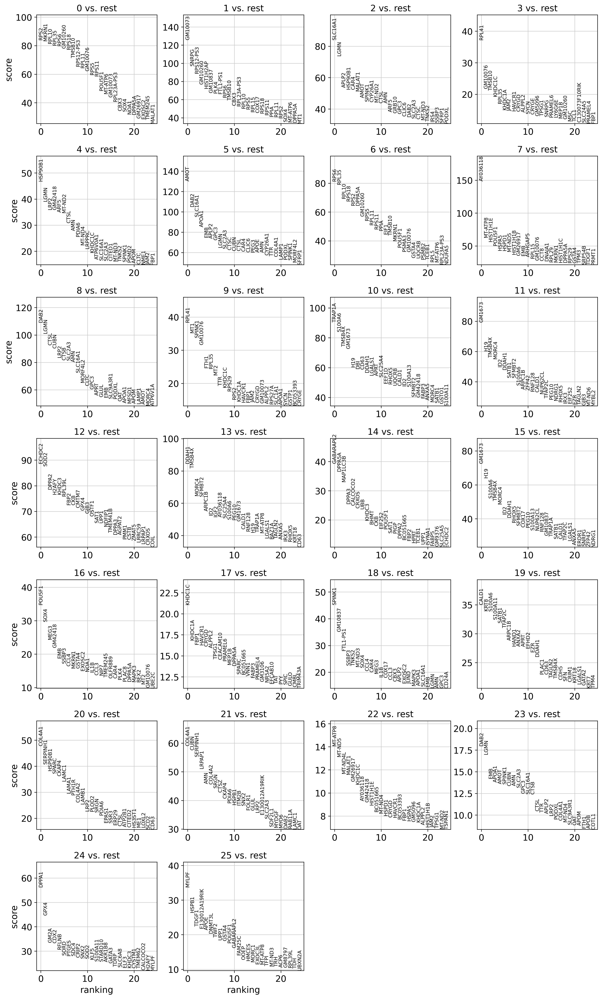

In [ ]:
sc.tl.rank_genes_groups(raw_AD, 'leiden', method='t-test', corr_method="bonferroni")
sc.pl.rank_genes_groups(raw_AD, n_genes=25, sharey=False)

# Gene set analysis for different tissue types that exist across time points 3.5-5.5

Expression of marker genes for each gene set is used later on to assign cell types to clusters on the UMAP plot. 

***Trophectoderm gene set markers***


**Trophectoderm markers are CDX2 and GATA3** [link text](https://www.hindawi.com/journals/isrn/2014/208067/)

*Second, TE and ICM identities are linked to key molecular determinants such as differential Hippo signaling, which depends on the position of the cell and regulates the expression of certain lineage-specific transcription factors. Hippo signaling remains inactive in outer cells, leading to the translocation of the transcriptional cofactor Yap/Taz in the nucleus, which then binds the transcription factor TEAD4 and results in the expression of the TE-specific transcription factor Cdx2; importantly, an additional target gene directed by TEAD4 is Gata3, which encodes for another TE-specific transcription factor (Ralston et al. 2010) [link](https://https://www.ncbi.nlm.nih.gov/pmc/articles/PMC3469159/)

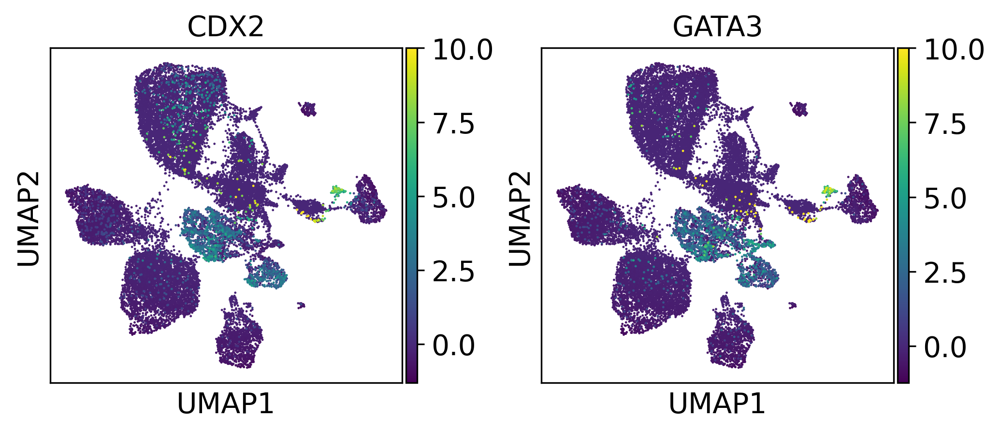

In [ ]:
sc.settings.set_figure_params(dpi=150, figsize=(3, 3))
sc.pl.umap(raw_AD, color=["CDX2", "GATA3"], #THESE ARE TROPHECTODERM MARKERS 
           legend_loc='on data', ncols=3)

***ICM-Epiblast***

**The marker for epiblast is NANOG**

Inner cell mass markers depend on the 3 pluripotency regulators: OCT4, NANOG, SOX2. But only NANOG works on this dataset for some reason.[link](https://https://www.hindawi.com/journals/isrn/2014/208067/) note: the transcription of Nanog is maintained at high levels in all cells until the 32-cell stage, and loss in trophectoderm is only detected at the 64-cell stage [4].

*so instead I looked at the two types of ICM cells (Primitive endoderm (PrE) and Epiblast (EPI)

*the lineage-specific markers Gata6 and Nanog were mutually exclusively expressed in the E3.5 ICM (Chazaud et al., 2006) [link](https://https://dev.biologists.org/content/137/5/715.long)

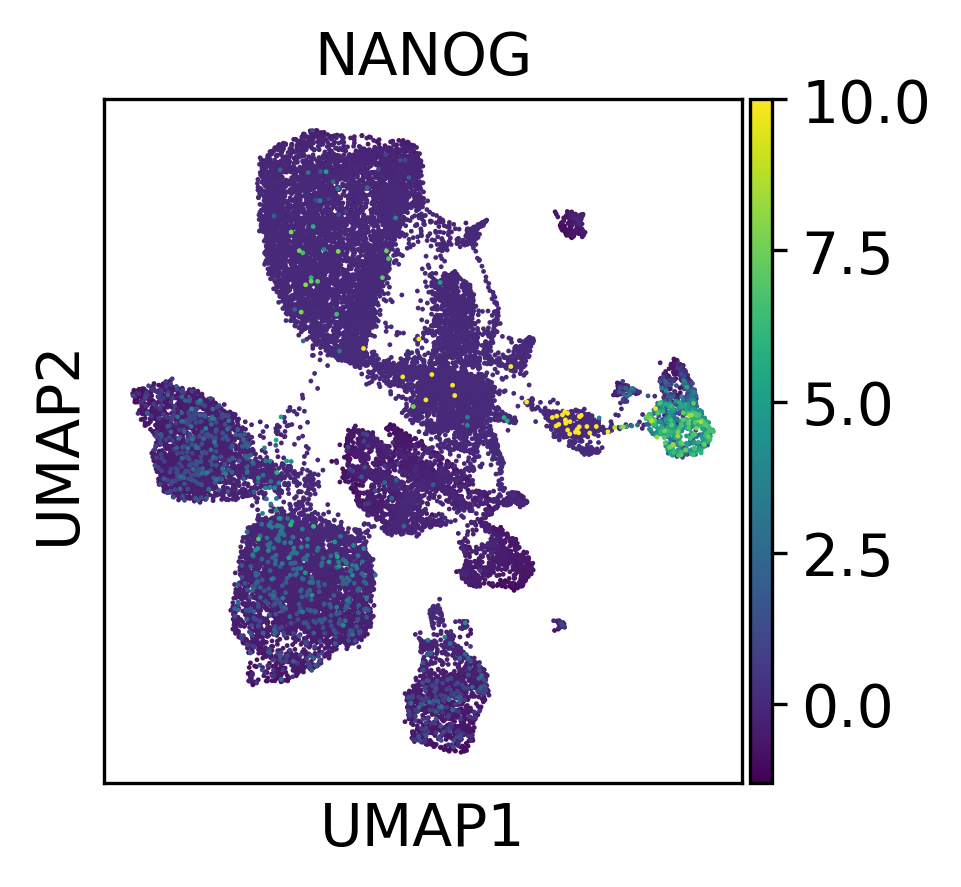

In [34]:
sc.settings.set_figure_params(dpi=150, figsize=(3, 3))
sc.pl.umap(raw_AD, color=['NANOG'], #Epiblast
           legend_loc='on data', ncols=3)

***ICM-Primitive endoderm (PrE)***

*This dynamic distribution of SOX17 resembled the localization of GATA6 and GATA4, two other PrE lineage-specific transcription factors. By contrast, SOX7 was only detected in PrE cells positioned in contact with the blastocoel, raising the possibility that these cells are molecularly distinct. Our observations support a model of sequential GATA6 > SOX17 > GATA4 > SOX7 transcription factor activation within the PrE lineage, [link](https://www.ncbi.nlm.nih.gov/pmc/articles/PMC3461954/)


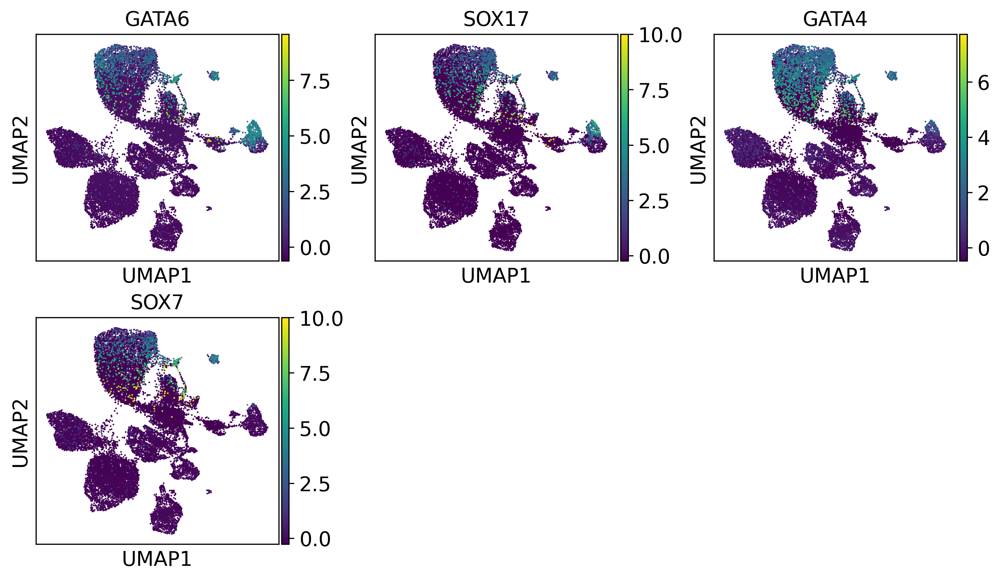

In [35]:
sc.settings.set_figure_params(dpi=150, figsize=(3, 3))
sc.pl.umap(raw_AD, color=["GATA6", "SOX17", "GATA4", "SOX7"], #Primitive endoderm (PrE cells)
           legend_loc='on data', ncols=3)

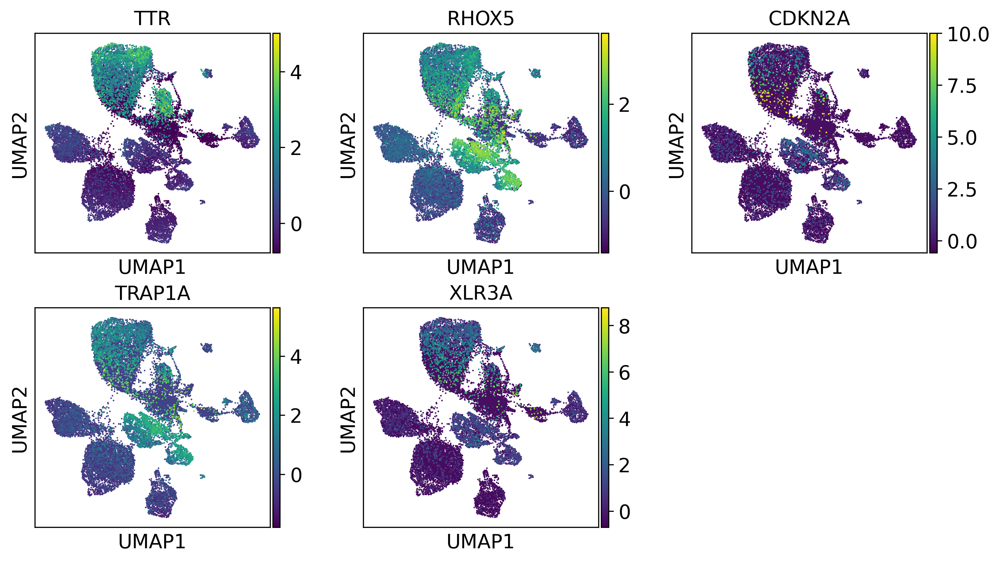

In [36]:
sc.settings.set_figure_params(dpi=150, figsize=(3, 3))
sc.pl.umap(raw_AD, color=["TTR","RHOX5","CDKN2A", "TRAP1A", "XLR3A"], #classifier genes that are best predictive of visceral endoderm (fig 4e)
           legend_loc='on data', ncols=3)

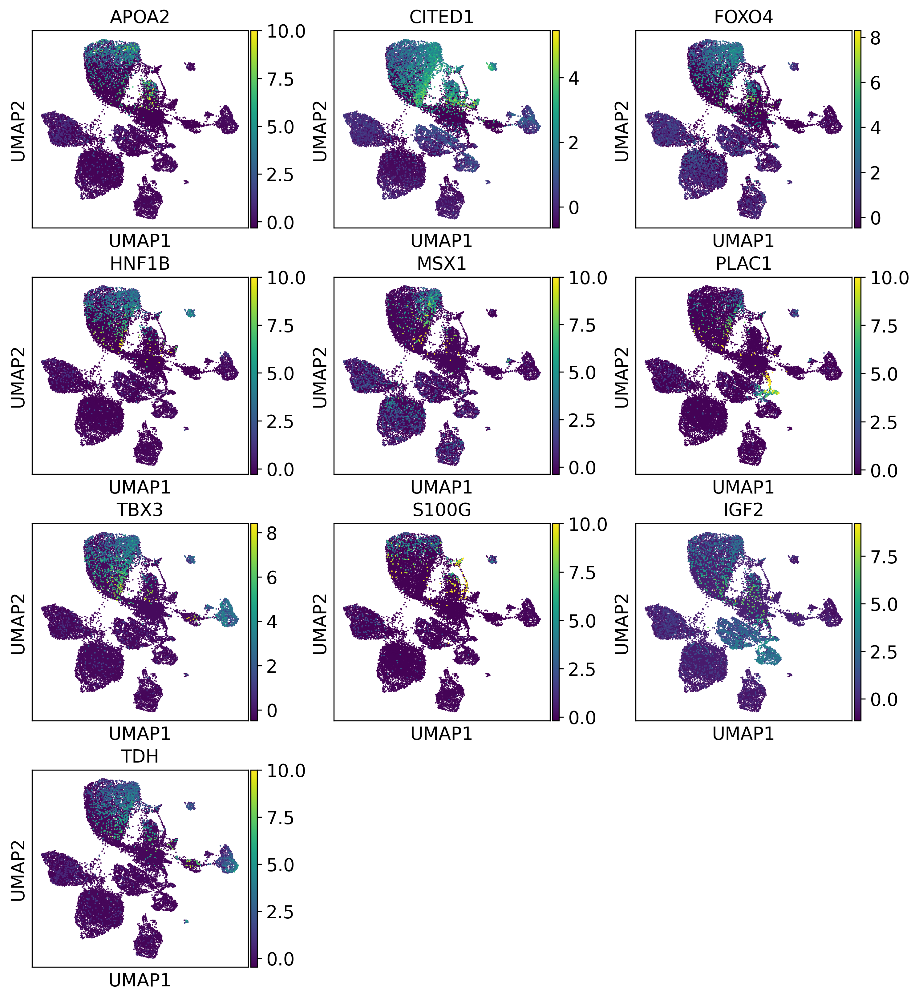

In [37]:
sc.settings.set_figure_params(dpi=150, figsize=(3, 3))
sc.pl.umap(raw_AD, color=["APOA2", "CITED1", "FOXO4", "HNF1B", "MSX1", "PLAC1", "TBX3", "S100G", "IGF2", "TDH"], #these are all extra-embryonic visceral endoderm (exVE) specific for E 5.5
           legend_loc='on data', ncols=3)

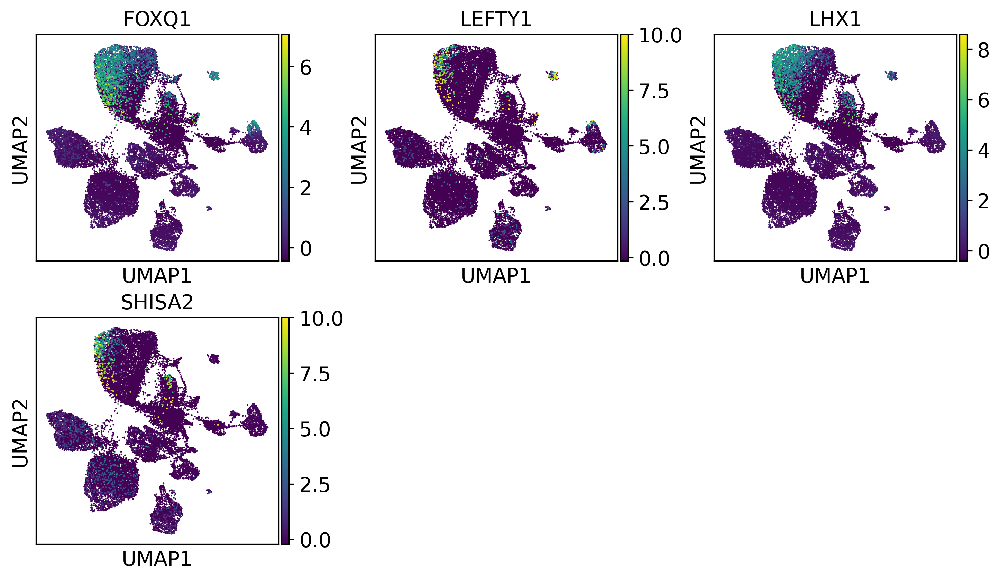

In [40]:
sc.settings.set_figure_params(dpi=150, figsize=(3, 3))
sc.pl.umap(raw_AD, color=["FOXQ1", "LEFTY1", "LHX1", "SHISA2"], #these are all embryonic visceral endoderm (emVE) specific for E 5.5 (from heat map of genes fig 3c)
           legend_loc='on data', ncols=3)

In [41]:
#labeling clusters based on gene markers
cluster_names = [
    "0", # cluster 0
    "1", # cluster 1 
    "ICM-PrE-1", # cluster 2
    "3", # cluster 3
    "ICM-PrE-2", # cluster 4
    "ICM-PrE-3", # cluster 5
    "6", # cluster 6
    "7", # cluster 7
    "ICM-PrE-4", # cluster 8
    "ICM-PrE-5", # cluster 9
    "10", # cluster 10
    "11", # cluster 11
    "ICM-EPI-1", # cluster 12
    "13", # cluster13
    "ICM-EPI-2", # cluster 14
    "15", # cluster 15
    "16", # cluster 16 
    "17", # cluster 17
    "18", # cluster 18
    "19", # cluster 19
    "ICM-PrE-6", # cluster 20
    "21", # cluster 21
    "22", # cluster 22
    "ICM-PrE-7", # cluster 23
    "Trophectoderm", # cluster 24
    "25" # cluster 25
]

# Based on marker genes, we assign the clusters to their identity

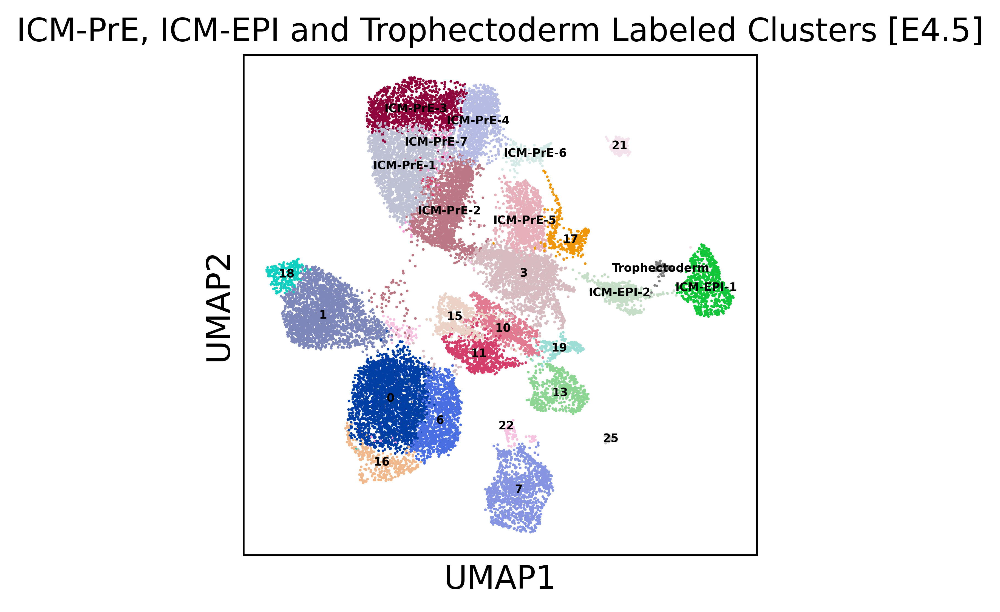

In [50]:

sc.settings.set_figure_params(dpi=300)
raw_AD.rename_categories('leiden', cluster_names)
sc.pl.umap(raw_AD, color='leiden', legend_loc='on data', title='ICM-PrE, ICM-EPI and Trophectoderm Labeled Clusters [E4.5]', legend_fontsize=5)

below PrE splits into ParE (not labeled here couldnt find marker gene besides vimetin which wasnt in dataset) and Visceral endoderm (VE) which we focus on like the paper. Note: there will be some overlap between PrE and VE

In [46]:
#labeling clusters based on gene markers
cluster_names2 = [
    "VE-0", # cluster 0
    "VE-1", # cluster 1 
    "VE-2", # cluster 2
    "VE-3", # cluster 3
    "VE-4", # cluster 4
    "VE-5", # cluster 5
    "VE-6", # cluster 6
    "7", # cluster 7
    "VE-8", # cluster 8
    "VE-9", # cluster 9
    "VE-10", # cluster 10
    "VE-11", # cluster 11
    "ICM-EPI-1", # cluster 12
    "VE-13", # cluster13
    "ICM-EPI-2", # cluster 14
    "15", # cluster 15
    "16", # cluster 16 
    "VE-17", # cluster 17
    "18", # cluster 18
    "VE-19", # cluster 19
    "VE-20", # cluster 20
    "VE-21", # cluster 21
    "22", # cluster 22
    "VE-23", # cluster 23
    "Trophectoderm", # cluster 24
    "25" # cluster 25
]

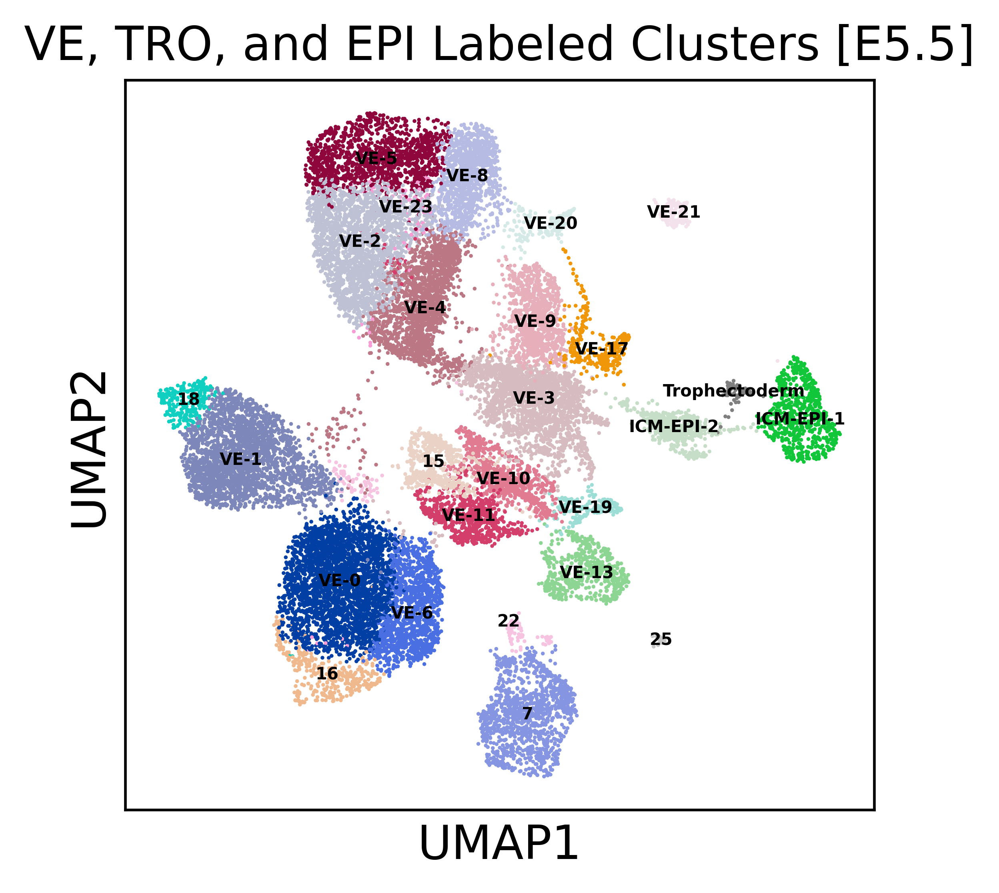

In [51]:

sc.settings.set_figure_params(dpi=300)
raw_AD.rename_categories('leiden', cluster_names2)
sc.pl.umap(raw_AD, color='leiden', legend_loc='on data', title='VE, TRO, and EPI Labeled Clusters [E5.5]', legend_fontsize=5)

Next cluster cell type labeling was done following Fig 3C, where at 5.5 they were looking at different gene expression within the visceral endoderm cells to see if there was gene expression difference between emVE and exVE, so now I will include those labels

In [52]:
#labeling clusters based on gene markers
cluster_names3 = [
    "VE-0", # cluster 0
    "VE-1", # cluster 1 
    "emVE-2", # cluster 2
    "VE-3", # cluster 3
    "exVE-4", # cluster 4
    "emVE-5", # cluster 5
    "VE-6", # cluster 6
    "7", # cluster 7
    "exVE-8", # cluster 8
    "exVE-9", # cluster 9
    "exVE-10", # cluster 10
    "VE-11", # cluster 11
    "ICM-EPI-1", # cluster 12
    "exVE-13", # cluster13
    "ICM-EPI-2", # cluster 14
    "exVE-15", # cluster 15
    "16", # cluster 16 
    "exVE-17", # cluster 17
    "18", # cluster 18
    "exVE-19", # cluster 19
    "exVE-20", # cluster 20
    "emVE-21", # cluster 21
    "22", # cluster 22
    "VE-23", # cluster 23
    "Trophectoderm", # cluster 24
    "25" # cluster 25
]

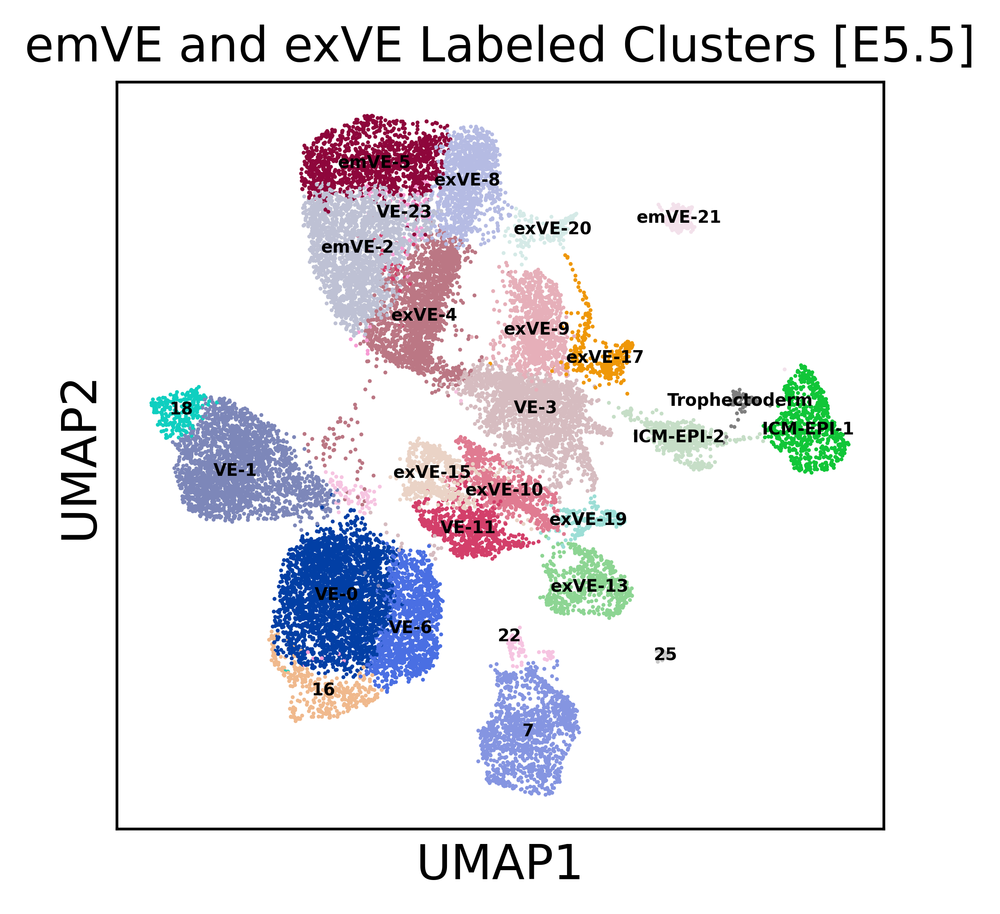

In [53]:

sc.settings.set_figure_params(dpi=300)
raw_AD.rename_categories('leiden', cluster_names3)
sc.pl.umap(raw_AD, color='leiden', legend_loc='on data', title='emVE and exVE Labeled Clusters [E5.5]', legend_fontsize=5)